In [1]:
import numpy as np
import pandas as pd

In [2]:
from functions import *



df = pd.read_csv("October.csv")
df.head()

,Unnamed: 0,time,open,high,low,close,tick_volume,spread,real_volume
0,0,2022-01-03 01:00:00,1.13753,1.13784,1.13748,1.13782,192,0,0
1,1,2022-01-03 01:05:00,1.13782,1.13782,1.13742,1.13763,119,0,0
2,2,2022-01-03 01:10:00,1.13762,1.13763,1.13728,1.13730,106,0,0
3,3,2022-01-03 01:15:00,1.13729,1.13762,1.13713,1.13718,115,0,0
4,4,2022-01-03 01:20:00,1.13718,1.13721,1.13697,1.13705,44,0,0


In [3]:
del df['Unnamed: 0']

In [4]:
rsi(df)

,time,open,high,low,close,tick_volume,spread,real_volume,RSI
0,2022-01-03 01:00:00,1.13753,1.13784,1.13748,1.13782,192,0,0,NaN
1,2022-01-03 01:05:00,1.13782,1.13782,1.13742,1.13763,119,0,0,0.000000
2,2022-01-03 01:10:00,1.13762,1.13763,1.13728,1.13730,106,0,0,0.000000
3,2022-01-03 01:15:00,1.13729,1.13762,1.13713,1.13718,115,0,0,0.000000
4,2022-01-03 01:20:00,1.13718,1.13721,1.13697,1.13705,44,0,0,0.000000
...,...,...,...,...,...,...,...,...,...
211524,2024-10-30 23:40:00,1.08594,1.08605,1.08593,1.08597,82,0,0,37.068966
211525,2024-10-30 23:45:00,1.08597,1.08598,1.08576,1.08576,140,0,0,30.370370
211526,2024-10-30 23:50:00,1.08576,1.08581,1.08563,1.08563,149,0,0,30.827068
211527,2024-10-30 23:55:00,1.08563,1.08569,1.08550,1.08566,197,0,0,31.343284


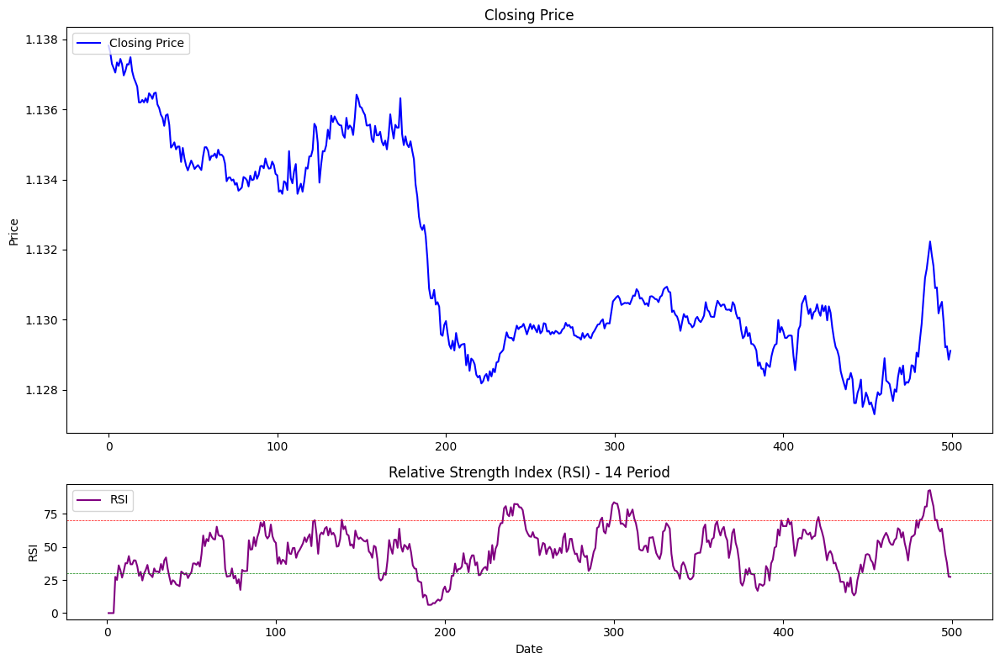

In [5]:
import matplotlib.pyplot as plt

data = df.head(500)
period = 14
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), gridspec_kw={'height_ratios': [3, 1]})

# Plot the closing price on the first subplot
ax1.plot(data['close'], color='blue', label='Closing Price')
ax1.set_title('Closing Price')
ax1.set_ylabel('Price')
ax1.legend(loc='upper left')

# Plot the RSI on the second subplot
ax2.plot(data['RSI'], color='purple', label='RSI')
ax2.axhline(70, color='red', linestyle='--', linewidth=0.5)  # Overbought line
ax2.axhline(30, color='green', linestyle='--', linewidth=0.5)  # Oversold line
ax2.set_title(f'Relative Strength Index (RSI) - {period} Period')
ax2.set_ylabel('RSI')
ax2.set_xlabel('Date')
ax2.legend(loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

In [6]:
def rsi_signal(data, period=14):
    """Calculate the RSI and generate buy/sell signals based on the first crossover with thresholds."""
    # Ensure RSI is calculated
    data = rsi(data, period)
    
    # Initialize the 'Signal' column
    data['Signal'] = 0  # Default: No signal
    
    # Track the previous state of the RSI and signals
    prev_rsi = None
    buy_signal_triggered = False
    sell_signal_triggered = False
    
    for i in range(len(data)):
        current_rsi = data['RSI'].iloc[i]
        
        # Only check if the previous RSI value is available
        if prev_rsi is not None:
            # Check for buy signal (first time crossing below 30)
            if current_rsi < 30 and prev_rsi >= 30 and not buy_signal_triggered:
                data['Signal'].iloc[i] = 1  # Buy signal
                buy_signal_triggered = True  # Mark buy signal as triggered
            
            # Check for sell signal (first time crossing above 70)
            elif current_rsi > 70 and prev_rsi <= 70 and not sell_signal_triggered:
                data['Signal'].iloc[i] = -1  # Sell signal
                sell_signal_triggered = True  # Mark sell signal as triggered
            
            # Reset signals if crossing back into neutral range (30-70)
            if current_rsi >= 30 and current_rsi <= 70:
                buy_signal_triggered = False
                sell_signal_triggered = False

        # Update previous RSI
        prev_rsi = current_rsi
    
    return data

# Usage example:
# data = rsi_signal(data)


In [7]:
gg = rsi_signal(df)

C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\1343885906.py:21: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['Signal'].iloc[i] = 1  # Buy signal
C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\1343885906.py:21: SettingWithCopyWar

In [8]:
gg

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal
0,2022-01-03 01:00:00,1.13753,1.13784,1.13748,1.13782,192,0,0,NaN,0
1,2022-01-03 01:05:00,1.13782,1.13782,1.13742,1.13763,119,0,0,0.000000,0
2,2022-01-03 01:10:00,1.13762,1.13763,1.13728,1.13730,106,0,0,0.000000,0
3,2022-01-03 01:15:00,1.13729,1.13762,1.13713,1.13718,115,0,0,0.000000,0
4,2022-01-03 01:20:00,1.13718,1.13721,1.13697,1.13705,44,0,0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...
211524,2024-10-30 23:40:00,1.08594,1.08605,1.08593,1.08597,82,0,0,37.068966,0
211525,2024-10-30 23:45:00,1.08597,1.08598,1.08576,1.08576,140,0,0,30.370370,0
211526,2024-10-30 23:50:00,1.08576,1.08581,1.08563,1.08563,149,0,0,30.827068,0
211527,2024-10-30 23:55:00,1.08563,1.08569,1.08550,1.08566,197,0,0,31.343284,0


In [9]:
gg['Signal'].value_counts()

Signal
 0    198531
-1      6628
 1      6370
Name: count, dtype: int64

In [10]:
import matplotlib.pyplot as plt

def plot_rsi_with_signals(data, period=14):
    """Plot RSI with buy/sell signals indicated on the graph."""
    # Calculate RSI and signals
    data = rsi_signal(data, period)
    
    # Create a figure and axis for price and RSI
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), gridspec_kw={'height_ratios': [3, 1]})
    
    # Plot the closing price on the first subplot
    ax1.plot(data['close'], color='blue', label='Closing Price')
    ax1.set_title('Closing Price')
    ax1.set_ylabel('Price')
    ax1.legend(loc='upper left')
    
    # Plot the RSI on the second subplot
    ax2.plot(data['RSI'], color='purple', label='RSI')
    ax2.axhline(70, color='red', linestyle='--', linewidth=0.5)  # Overbought line
    ax2.axhline(30, color='green', linestyle='--', linewidth=0.5)  # Oversold line
    
    # Mark buy signals (1) and sell signals (-1) on the RSI plot
    buy_signals = data[data['Signal'] == 1]
    sell_signals = data[data['Signal'] == -1]
    
    ax2.scatter(buy_signals.index, buy_signals['RSI'], color='green', marker='^', s=100, label='Buy Signal', zorder=5)
    ax2.scatter(sell_signals.index, sell_signals['RSI'], color='red', marker='v', s=100, label='Sell Signal', zorder=5)
    
    ax2.set_title(f'Relative Strength Index (RSI) - {period} Period')
    ax2.set_ylabel('RSI')
    ax2.set_xlabel('Date')
    ax2.legend(loc='upper left')
    
    # Show plot
    plt.tight_layout()
    plt.show()

# Usage: plot_rsi_with_signals(data), assuming 'data' is a DataFrame with 'close' and 'Signal' columns


f:\BullsEye - v5\functions.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['RSI'] = rsi
C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\1343885906.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Signal'] = 0  # Default: No signal
C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\1343885906.py:21: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Wri

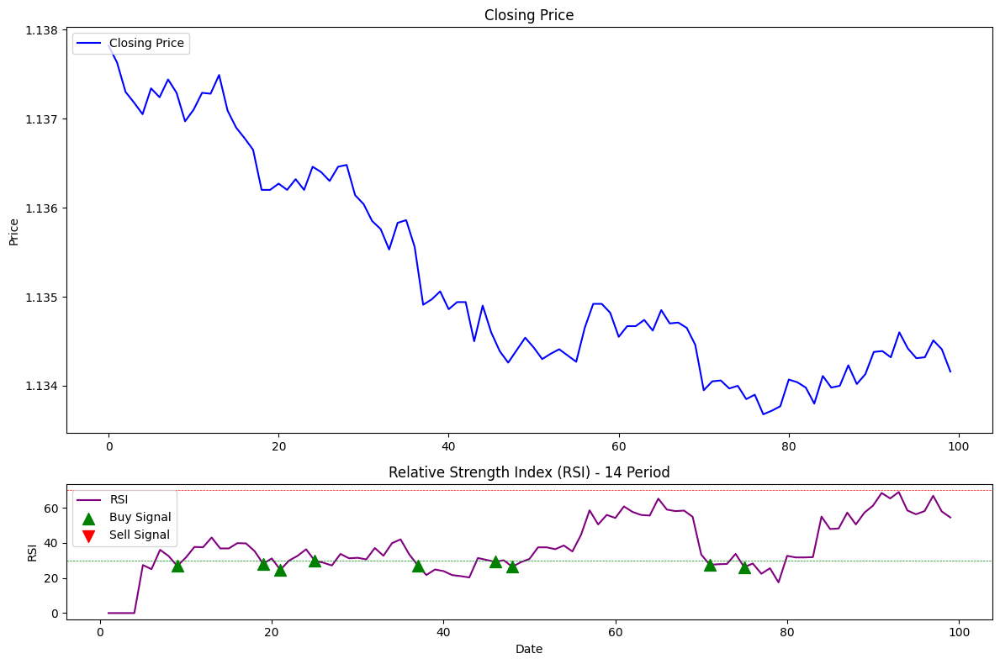

In [11]:
plot_rsi_with_signals(gg.head(100))

In [12]:
gg

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal
0,2022-01-03 01:00:00,1.13753,1.13784,1.13748,1.13782,192,0,0,NaN,0
1,2022-01-03 01:05:00,1.13782,1.13782,1.13742,1.13763,119,0,0,0.000000,0
2,2022-01-03 01:10:00,1.13762,1.13763,1.13728,1.13730,106,0,0,0.000000,0
3,2022-01-03 01:15:00,1.13729,1.13762,1.13713,1.13718,115,0,0,0.000000,0
4,2022-01-03 01:20:00,1.13718,1.13721,1.13697,1.13705,44,0,0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...
211524,2024-10-30 23:40:00,1.08594,1.08605,1.08593,1.08597,82,0,0,37.068966,0
211525,2024-10-30 23:45:00,1.08597,1.08598,1.08576,1.08576,140,0,0,30.370370,0
211526,2024-10-30 23:50:00,1.08576,1.08581,1.08563,1.08563,149,0,0,30.827068,0
211527,2024-10-30 23:55:00,1.08563,1.08569,1.08550,1.08566,197,0,0,31.343284,0


In [13]:
from functions import *

gg = calculate_macd(gg)

In [14]:
def add_time_features(df, time_column):
    """
    Adds time-based columns to a DataFrame.
    
    Parameters:
    df (pd.DataFrame): The input DataFrame containing a datetime column.
    time_column (str): The name of the column with datetime data.
    
    Returns:
    pd.DataFrame: The DataFrame with new time-based columns.
    """
    # Ensure the time_column is in datetime format
    df[time_column] = pd.to_datetime(df[time_column], errors='coerce')

    # Extract time features
    df['minute'] = df[time_column].dt.minute
    df['hour'] = df[time_column].dt.hour
    df['day'] = df[time_column].dt.day
    df['month'] = df[time_column].dt.month
    df['year'] = df[time_column].dt.year

    return df

In [15]:
gg = add_time_features(gg,'time')
gg.head()

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,ema_short,ema_long,MACD,signal_line,MACD_histogram,minute,hour,day,month,year
0,2022-01-03 01:00:00,1.13753,1.13784,1.13748,1.13782,192,0,0,NaN,0,1.137820,1.137820,0.000000,0.000000,0.000000,0,1,3,1,2022
1,2022-01-03 01:05:00,1.13782,1.13782,1.13742,1.13763,119,0,0,0.0,0,1.137791,1.137806,-0.000015,-0.000003,-0.000012,5,1,3,1,2022
2,2022-01-03 01:10:00,1.13762,1.13763,1.13728,1.13730,106,0,0,0.0,0,1.137715,1.137768,-0.000053,-0.000013,-0.000040,10,1,3,1,2022
3,2022-01-03 01:15:00,1.13729,1.13762,1.13713,1.13718,115,0,0,0.0,0,1.137633,1.137725,-0.000092,-0.000029,-0.000063,15,1,3,1,2022
4,2022-01-03 01:20:00,1.13718,1.13721,1.13697,1.13705,44,0,0,0.0,0,1.137543,1.137675,-0.000132,-0.000049,-0.000082,20,1,3,1,2022


In [16]:
import pandas as pd

def add_next_close_price_on_signal(df):
    """
    Adds a new column to the DataFrame with the close price of the next signal (1 or -1).
    Sets next_close to 0 if the current signal is 0.
    
    Parameters:
    df (pd.DataFrame): The input DataFrame with 'close' and 'Signal' columns.
    
    Returns:
    pd.DataFrame: The DataFrame with the new column 'next_close'.
    """
    # Initialize a new column
    df['next_close'] = None
    
    # Loop through the DataFrame to find the next signal's close price
    for i in range(len(df)):
        if df.at[i, 'Signal'] == 0:
            df.at[i, 'next_close'] = 0  # Set next_close to 0 if Signal is 0
            df.at[i, 'Profit'] = None  # Set next_close to 0 if Signal is 0
        elif df.at[i, 'Signal'] in [1, -1]:  # Check for buy or sell signal
            # Find the next row with either a 1 or -1 signal
            for j in range(i + 1, len(df)):
                if df.at[j, 'Signal'] in [1, -1]:
                    df.at[i, 'next_close'] = df.at[j, 'close']
                    break  # Exit the inner loop once the next signal is found

    return df

In [17]:
def prof_calc(gg):
    dd = add_next_close_price_on_signal(gg)
    dd['Profit'] = dd['close'] - dd['next_close']
    for i in range(len(dd)):
        if dd.at[i, 'Signal'] == 0:
            dd.at[i, 'next_close'] = 0  # Set next_close to 0 if Signal is 0
            dd.at[i, 'Profit'] = 0 
            
    for i in range(len(dd)):
        if dd.at[i,'Signal'] == 1:
            dd.at[i,'Profit'] = dd.at[i, 'Profit'] * -1
            
    dd['Profit Cat'] = None
    for i in range(len(dd)):
        if dd.at[i, 'Signal'] == 0:
            dd.at[i, 'next_close'] = 0  # Set next_close to 0 if Signal is 0
            dd.at[i, 'Profit'] = 0 
    for i in range(len(dd)):
        if dd.at[i,'Profit'] > 0:
            dd.at[i,'Profit Cat'] = 1
        elif dd.at[i,'Profit'] < 0:
            dd.at[i,'Profit Cat'] = -1
        else:
            dd.at[i,'Profit Cat'] = 0

            
    return dd

In [18]:
dd = prof_calc(gg)

In [19]:
dd[dd['Signal']==1]

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,...,signal_line,MACD_histogram,minute,hour,day,month,year,next_close,Profit,Profit Cat
9,2022-01-03 01:45:00,1.13728,1.13729,1.13697,1.13697,71,0,0,26.775956,1,...,-0.000118,-0.000053,45,1,3,1,2022,1.1362,-0.00077,-1
19,2022-01-03 02:35:00,1.13620,1.13631,1.13609,1.13620,68,0,0,28.076923,1,...,-0.000213,-0.000099,35,2,3,1,2022,1.1362,-0.0,0
21,2022-01-03 02:45:00,1.13626,1.13628,1.13611,1.13620,64,0,0,24.590164,1,...,-0.000261,-0.000093,45,2,3,1,2022,1.1364,0.0002,1
25,2022-01-03 03:05:00,1.13646,1.13647,1.13633,1.13640,63,0,0,29.864253,1,...,-0.000309,-0.000018,5,3,3,1,2022,1.13491,-0.00149,-1
37,2022-01-03 04:05:00,1.13555,1.13555,1.13491,1.13491,111,0,0,27.208481,1,...,-0.000350,-0.000064,5,4,3,1,2022,1.13439,-0.00052,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211417,2024-10-30 14:45:00,1.08273,1.08273,1.08236,1.08237,205,0,0,27.227723,1,...,-0.000134,-0.000106,45,14,30,10,2024,1.0813,-0.00107,-1
211423,2024-10-30 15:15:00,1.08280,1.08283,1.08120,1.08130,692,0,0,22.752809,1,...,-0.000258,-0.000103,15,15,30,10,2024,1.08109,-0.00021,-1
211428,2024-10-30 15:40:00,1.08160,1.08171,1.08098,1.08109,413,0,0,27.272727,1,...,-0.000462,-0.000133,40,15,30,10,2024,1.08291,0.00182,1
211507,2024-10-30 22:15:00,1.08602,1.08602,1.08563,1.08579,191,0,0,23.076923,1,...,0.000170,-0.000163,15,22,30,10,2024,1.08605,0.00026,1


In [20]:
df = dd


In [21]:
df_filtered = df[df['Signal']!=0]

In [22]:
df_filtered.reset_index(inplace=True)
del df_filtered['index']

In [23]:
df_filtered.dropna(inplace=True)

C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\208647654.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.dropna(inplace=True)


In [24]:
df_filtered.loc[df_filtered['Profit Cat'] == 0, 'Profit Cat'] = 1
df_filtered.loc[df_filtered['Profit Cat'] == -1, 'Profit Cat'] = 0

In [25]:
df_filtered['Profit Cat'].value_counts()

Profit Cat
0    7101
1    5896
Name: count, dtype: int64

In [26]:
df_filtered

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,...,signal_line,MACD_histogram,minute,hour,day,month,year,next_close,Profit,Profit Cat
0,2022-01-03 01:45:00,1.13728,1.13729,1.13697,1.13697,71,0,0,26.775956,1,...,-0.000118,-0.000053,45,1,3,1,2022,1.1362,-0.00077,0
1,2022-01-03 02:35:00,1.13620,1.13631,1.13609,1.13620,68,0,0,28.076923,1,...,-0.000213,-0.000099,35,2,3,1,2022,1.1362,-0.0,1
2,2022-01-03 02:45:00,1.13626,1.13628,1.13611,1.13620,64,0,0,24.590164,1,...,-0.000261,-0.000093,45,2,3,1,2022,1.1364,0.0002,1
3,2022-01-03 03:05:00,1.13646,1.13647,1.13633,1.13640,63,0,0,29.864253,1,...,-0.000309,-0.000018,5,3,3,1,2022,1.13491,-0.00149,0
4,2022-01-03 04:05:00,1.13555,1.13555,1.13491,1.13491,111,0,0,27.208481,1,...,-0.000350,-0.000064,5,4,3,1,2022,1.13439,-0.00052,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12992,2024-10-30 16:35:00,1.08225,1.08312,1.08221,1.08291,394,0,0,72.592593,-1,...,-0.000336,0.000207,35,16,30,10,2024,1.08602,-0.00311,0
12993,2024-10-30 19:10:00,1.08589,1.08610,1.08582,1.08602,206,0,0,78.014184,-1,...,0.000659,-0.000067,10,19,30,10,2024,1.0868,-0.00078,0
12994,2024-10-30 21:10:00,1.08684,1.08689,1.08676,1.08680,167,0,0,71.320755,-1,...,0.000282,0.000016,10,21,30,10,2024,1.08688,-0.00008,0
12995,2024-10-30 21:30:00,1.08682,1.08689,1.08678,1.08688,151,0,0,70.175439,-1,...,0.000300,0.000004,30,21,30,10,2024,1.08579,0.00109,1


In [27]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


In [28]:
df= df_filtered

In [29]:
df['Profit Cat'].isna().sum()

0

In [30]:
# Assuming you want to classify based on whether 'Profit Cat' is greater than a threshold (e.g., 0)
df['Profit Cat'] = (df['Profit Cat'] > 0).astype(int)

# Now proceed with classification as in the original RandomForestClassifier example


C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\3921298252.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Profit Cat'] = (df['Profit Cat'] > 0).astype(int)


In [31]:
fff = df.drop(['time'], axis=1)

In [32]:
fff

,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,ema_short,...,signal_line,MACD_histogram,minute,hour,day,month,year,next_close,Profit,Profit Cat
0,1.13728,1.13729,1.13697,1.13697,71,0,0,26.775956,1,1.137366,...,-0.000118,-0.000053,45,1,3,1,2022,1.1362,-0.00077,0
1,1.13620,1.13631,1.13609,1.13620,68,0,0,28.076923,1,1.136837,...,-0.000213,-0.000099,35,2,3,1,2022,1.1362,-0.0,1
2,1.13626,1.13628,1.13611,1.13620,64,0,0,24.590164,1,1.136665,...,-0.000261,-0.000093,45,2,3,1,2022,1.1364,0.0002,1
3,1.13646,1.13647,1.13633,1.13640,63,0,0,29.864253,1,1.136514,...,-0.000309,-0.000018,5,3,3,1,2022,1.13491,-0.00149,0
4,1.13555,1.13555,1.13491,1.13491,111,0,0,27.208481,1,1.135796,...,-0.000350,-0.000064,5,4,3,1,2022,1.13439,-0.00052,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12992,1.08225,1.08312,1.08221,1.08291,394,0,0,72.592593,-1,1.081967,...,-0.000336,0.000207,35,16,30,10,2024,1.08602,-0.00311,0
12993,1.08589,1.08610,1.08582,1.08602,206,0,0,78.014184,-1,1.085945,...,0.000659,-0.000067,10,19,30,10,2024,1.0868,-0.00078,0
12994,1.08684,1.08689,1.08676,1.08680,167,0,0,71.320755,-1,1.086530,...,0.000282,0.000016,10,21,30,10,2024,1.08688,-0.00008,0
12995,1.08682,1.08689,1.08678,1.08688,151,0,0,70.175439,-1,1.086718,...,0.000300,0.000004,30,21,30,10,2024,1.08579,0.00109,1


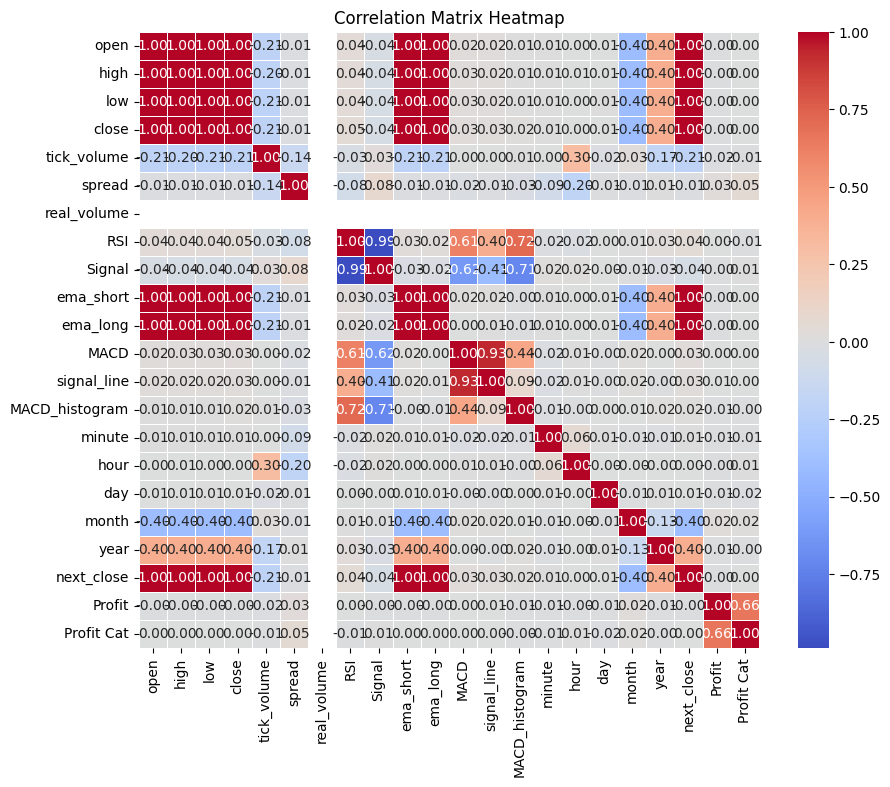

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data
# df = pd.read_csv('your_dataset.csv')

# Calculate the correlation matrix
correlation_matrix = fff.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Customize plot labels
plt.title("Correlation Matrix Heatmap")
plt.show()


In [34]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Sample data
# df = pd.read_csv('your_dataset.csv')

df_alt = df[['open','high','low','close']]

# Step 1: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_alt)

# Step 2: Apply PCA
# Set the number of components you want to retain (e.g., 2 or enough to explain 95% variance)
pca = PCA(n_components=0.95)  # Retain 95% of the variance
principal_components = pca.fit_transform(scaled_data)

# Convert the result to a DataFrame for easier handling
principal_df = pd.DataFrame(data=principal_components, columns=[f"PC{i+1}" for i in range(principal_components.shape[1])])

# Explained variance
explained_variance = pca.explained_variance_ratio_
print("Explained variance by each principal component:", explained_variance)

# Resulting DataFrame with Principal Components
print(principal_df.head())


Explained variance by each principal component: [0.99993198]
        PC1
0  3.645246
1  3.592314
2  3.593027
3  3.604582
4  3.536968


In [35]:
principal_df

,PC1
0,3.645246
1,3.592314
2,3.593027
3,3.604582
4,3.536968
...,...
12992,0.534834
12993,0.725139
12994,0.774499
12995,0.775640


In [36]:
df['PCA'] = principal_df['PC1']

C:\Users\hevar\AppData\Local\Temp\ipykernel_12076\3247566773.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PCA'] = principal_df['PC1']


In [37]:
df

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,...,MACD_histogram,minute,hour,day,month,year,next_close,Profit,Profit Cat,PCA
0,2022-01-03 01:45:00,1.13728,1.13729,1.13697,1.13697,71,0,0,26.775956,1,...,-0.000053,45,1,3,1,2022,1.1362,-0.00077,0,3.645246
1,2022-01-03 02:35:00,1.13620,1.13631,1.13609,1.13620,68,0,0,28.076923,1,...,-0.000099,35,2,3,1,2022,1.1362,-0.0,1,3.592314
2,2022-01-03 02:45:00,1.13626,1.13628,1.13611,1.13620,64,0,0,24.590164,1,...,-0.000093,45,2,3,1,2022,1.1364,0.0002,1,3.593027
3,2022-01-03 03:05:00,1.13646,1.13647,1.13633,1.13640,63,0,0,29.864253,1,...,-0.000018,5,3,3,1,2022,1.13491,-0.00149,0,3.604582
4,2022-01-03 04:05:00,1.13555,1.13555,1.13491,1.13491,111,0,0,27.208481,1,...,-0.000064,5,4,3,1,2022,1.13439,-0.00052,0,3.536968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12992,2024-10-30 16:35:00,1.08225,1.08312,1.08221,1.08291,394,0,0,72.592593,-1,...,0.000207,35,16,30,10,2024,1.08602,-0.00311,0,0.534834
12993,2024-10-30 19:10:00,1.08589,1.08610,1.08582,1.08602,206,0,0,78.014184,-1,...,-0.000067,10,19,30,10,2024,1.0868,-0.00078,0,0.725139
12994,2024-10-30 21:10:00,1.08684,1.08689,1.08676,1.08680,167,0,0,71.320755,-1,...,0.000016,10,21,30,10,2024,1.08688,-0.00008,0,0.774499
12995,2024-10-30 21:30:00,1.08682,1.08689,1.08678,1.08688,151,0,0,70.175439,-1,...,0.000004,30,21,30,10,2024,1.08579,0.00109,1,0.775640


In [38]:
import pandas as pd
import numpy as np

# Assuming df is your original DataFrame
# Define the feature columns and the target column
feature_columns = ['PCA','RSI', 'Signal','MACD','signal_line','MACD_histogram','month','hour','minute','day']  # List of feature columns
target_column = 'Profit Cat'  # Target column

# Sequential split (80% train, 10% val, 10% test)
train_size = int(len(df) * 0.8)
val_size = int(len(df) * 0.1)

train, val, test = df[:train_size], df[train_size:train_size + val_size], df[train_size + val_size:]

# Check shapes of train, val, test sets
print("Train shape:", train.shape)
print("Validation shape:", val.shape)
print("Test shape:", test.shape)


Train shape: (10397, 24)
Validation shape: (1299, 24)
Test shape: (1301, 24)


In [39]:
test['Profit Cat'].value_counts()

Profit Cat
0    701
1    600
Name: count, dtype: int64

In [40]:
test

,time,open,high,low,close,tick_volume,spread,real_volume,RSI,Signal,...,MACD_histogram,minute,hour,day,month,year,next_close,Profit,Profit Cat,PCA
11696,2024-07-19 03:50:00,1.08944,1.08946,1.08912,1.08916,201,0,0,25.000000,1,...,-0.000056,50,3,19,7,2024,1.08893,-0.00023,0,0.915601
11697,2024-07-19 04:30:00,1.08904,1.08914,1.08892,1.08893,234,0,0,24.369748,1,...,-0.000035,30,4,19,7,2024,1.08921,0.00028,1,0.899192
11698,2024-07-19 05:55:00,1.08908,1.08924,1.08907,1.08921,148,0,0,76.744186,-1,...,0.000062,55,5,19,7,2024,1.08882,0.00039,1,0.907323
11699,2024-07-19 07:05:00,1.08882,1.08887,1.08879,1.08882,81,0,0,24.000000,1,...,-0.000002,5,7,19,7,2024,1.08873,-0.00009,0,0.888774
11700,2024-07-19 07:25:00,1.08872,1.08873,1.08868,1.08873,87,0,0,28.301887,1,...,-0.000010,25,7,19,7,2024,1.08892,0.00019,1,0.882497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12992,2024-10-30 16:35:00,1.08225,1.08312,1.08221,1.08291,394,0,0,72.592593,-1,...,0.000207,35,16,30,10,2024,1.08602,-0.00311,0,0.534834
12993,2024-10-30 19:10:00,1.08589,1.08610,1.08582,1.08602,206,0,0,78.014184,-1,...,-0.000067,10,19,30,10,2024,1.0868,-0.00078,0,0.725139
12994,2024-10-30 21:10:00,1.08684,1.08689,1.08676,1.08680,167,0,0,71.320755,-1,...,0.000016,10,21,30,10,2024,1.08688,-0.00008,0,0.774499
12995,2024-10-30 21:30:00,1.08682,1.08689,1.08678,1.08688,151,0,0,70.175439,-1,...,0.000004,30,21,30,10,2024,1.08579,0.00109,1,0.775640


In [41]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming df is your original DataFrame with all necessary columns
# Ensure 'Profit Cat' is set correctly
# df['Profit Cat'] = df['Profit Cat'].replace(0, 1)  # Change Profit Cat from 0 to 1 where necessary

# # Define the feature columns and the target column
# feature_columns = ['close', 'RSI', 'Signal']  # List of feature columns
# target_column = 'Profit Cat'  # Target column

# Filter the DataFrame to include only the relevant columns
df_filtered = df[feature_columns + [target_column]]

# Split the dataset into train, validation, and test sets
train, temp = train_test_split(df_filtered, test_size=0.3, random_state=42, shuffle=False)
val, test = train_test_split(temp, test_size=0.5, random_state=42, shuffle=False)

# Check shapes of train, val, test sets
print("Train shape:", train.shape)
print("Validation shape:", val.shape)
print("Test shape:", test.shape)

# Create a mapping from column names to indices
column_indices = {col: idx for idx, col in enumerate(df_filtered.columns)}
print("Column indices:", column_indices)

def create_dataset(data, feature_columns, target_column, time_step=1):
    X, y = [], []
    features_indices = [column_indices[col] for col in feature_columns]
    target_index = column_indices[target_column]

    print("Feature indices:", features_indices)
    print("Target index:", target_index)

    for i in range(len(data) - time_step):
        X.append(data[i:(i + time_step), features_indices])  # selected feature columns
        y.append(data[i + time_step, target_index])          # target column
    return np.array(X), np.array(y)

# Set time step for LSTM
time_step = 5  # Example time step

# Create datasets
X_train, y_train = create_dataset(train.values, feature_columns, target_column, time_step)
X_val, y_val = create_dataset(val.values, feature_columns, target_column, time_step)
X_test, y_test = create_dataset(test.values, feature_columns, target_column, time_step)

# Print shapes to debug
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Convert to correct data types
X_train = X_train.astype(np.float32)
y_train = y_train.astype(np.float32)
X_val = X_val.astype(np.float32)
y_val = y_val.astype(np.float32)
X_test = X_test.astype(np.float32)

# Reshape input to be [samples, time steps, features]
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], len(feature_columns))
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], len(feature_columns))
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], len(feature_columns))

# Print final shapes to confirm reshaping
print(f"Final X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"Final X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"Final X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")


Train shape: (9097, 11)
Validation shape: (1950, 11)
Test shape: (1950, 11)
Column indices: {'PCA': 0, 'RSI': 1, 'Signal': 2, 'MACD': 3, 'signal_line': 4, 'MACD_histogram': 5, 'month': 6, 'hour': 7, 'minute': 8, 'day': 9, 'Profit Cat': 10}
Feature indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Target index: 10
Feature indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Target index: 10
Feature indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Target index: 10
X_train shape: (9092, 5, 10), y_train shape: (9092,)
X_val shape: (1945, 5, 10), y_val shape: (1945,)
X_test shape: (1945, 5, 10), y_test shape: (1945,)
Final X_train shape: (9092, 5, 10), y_train shape: (9092,)
Final X_val shape: (1945, 5, 10), y_val shape: (1945,)
Final X_test shape: (1945, 5, 10), y_test shape: (1945,)


In [42]:
df_filtered

,PCA,RSI,Signal,MACD,signal_line,MACD_histogram,month,hour,minute,day,Profit Cat
0,3.645246,26.775956,1,-0.000171,-0.000118,-0.000053,1,1,45,3,0
1,3.592314,28.076923,1,-0.000312,-0.000213,-0.000099,1,2,35,3,1
2,3.593027,24.590164,1,-0.000353,-0.000261,-0.000093,1,2,45,3,1
3,3.604582,29.864253,1,-0.000327,-0.000309,-0.000018,1,3,5,3,0
4,3.536968,27.208481,1,-0.000414,-0.000350,-0.000064,1,4,5,3,0
...,...,...,...,...,...,...,...,...,...,...,...
12992,0.534834,72.592593,-1,-0.000130,-0.000336,0.000207,10,16,35,30,0
12993,0.725139,78.014184,-1,0.000592,0.000659,-0.000067,10,19,10,30,0
12994,0.774499,71.320755,-1,0.000298,0.000282,0.000016,10,21,10,30,0
12995,0.775640,70.175439,-1,0.000304,0.000300,0.000004,10,21,30,30,1


In [43]:
df_filtered['Profit Cat'].value_counts()

Profit Cat
0    7101
1    5896
Name: count, dtype: int64

In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

# Define the model architecture function
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense, Bidirectional, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

def create_model(input_shape):
    model = Sequential()
    
    # Bidirectional GRU layer
    model.add(Bidirectional(GRU(128, return_sequences=True, recurrent_dropout=0.2), input_shape=input_shape))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())
    
    # Additional GRU layers
    model.add(GRU(64, return_sequences=True, recurrent_dropout=0.2))
    model.add(Dropout(0.3))
    
    model.add(GRU(64, recurrent_dropout=0.2))
    model.add(Dropout(0.3))
    
    # Output layer for binary classification
    model.add(Dense(1, activation='sigmoid'))
    
    # Compile with Adam optimizer and binary cross-entropy loss
    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

# Define input shape based on training data
input_shape = (X_train.shape[1], X_train.shape[2])

# Initialize two models with the same architecture
model1 = create_model(input_shape)
model2 = create_model(input_shape)

# Class weights for model1
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',  # This option adjusts weights inversely proportional to class frequencies
    classes=np.unique(y_train),  # List of all possible classes (e.g., 0 and 1)
    y=y_train  # The training labels
)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.9, patience=2, min_lr=1e-5)

# Convert class_weights into a dictionary
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}
print("Class weights:", class_weight_dict)

class_weights_dict = {0: 0.9, 1: 1.5}

# Train the first model with class weights
history1 = model1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    class_weight=class_weights_dict,
    callbacks=[reduce_lr],
    verbose=1
)




Class weights: {0: 0.9157937147461724, 1: 1.1012596899224807}
Epoch 1/20
285/285 [==============================] - 14s 18ms/step - loss: 0.8181 - accuracy: 0.4744 - val_loss: 0.7286 - val_accuracy: 0.4447 - lr: 0.0010
Epoch 2/20
285/285 [==============================] - 4s 14ms/step - loss: 0.8079 - accuracy: 0.4680 - val_loss: 0.7330 - val_accuracy: 0.4422 - lr: 0.0010
Epoch 3/20
285/285 [==============================] - 4s 14ms/step - loss: 0.8056 - accuracy: 0.4705 - val_loss: 0.7402 - val_accuracy: 0.4432 - lr: 0.0010
Epoch 4/20
285/285 [==============================] - 5s 16ms/step - loss: 0.8017 - accuracy: 0.4637 - val_loss: 0.7209 - val_accuracy: 0.4396 - lr: 9.0000e-04
Epoch 5/20
285/285 [==============================] - 4s 15ms/step - loss: 0.7999 - accuracy: 0.4691 - val_loss: 0.7399 - val_accuracy: 0.4427 - lr: 9.0000e-04
Epoch 6/20
285/285 [==============================] - 4s 15ms/step - loss: 0.8025 - accuracy: 0.4630 - val_loss: 0.7323 - val_accuracy: 0.4437 - lr: 

In [45]:

arr = y_train

unique_values, counts = np.unique(arr, return_counts=True)

print(f"Unique values: {unique_values}")
print(f"Counts: {counts}")

Unique values: [0. 1.]
Counts: [4964 4128]


In [46]:
# Train the second model without class weights
history2 = model2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=32,
    callbacks=[reduce_lr],
    verbose=1
)


Epoch 1/10
285/285 [==============================] - 14s 18ms/step - loss: 0.7034 - accuracy: 0.5188 - val_loss: 0.6901 - val_accuracy: 0.5368 - lr: 0.0010
Epoch 2/10
285/285 [==============================] - 4s 13ms/step - loss: 0.6960 - accuracy: 0.5255 - val_loss: 0.6909 - val_accuracy: 0.5357 - lr: 0.0010
Epoch 3/10
285/285 [==============================] - 4s 13ms/step - loss: 0.6957 - accuracy: 0.5305 - val_loss: 0.6931 - val_accuracy: 0.5537 - lr: 0.0010
Epoch 4/10
285/285 [==============================] - 4s 14ms/step - loss: 0.6935 - accuracy: 0.5388 - val_loss: 0.6901 - val_accuracy: 0.5429 - lr: 9.0000e-04
Epoch 5/10
285/285 [==============================] - 4s 13ms/step - loss: 0.6917 - accuracy: 0.5407 - val_loss: 0.6904 - val_accuracy: 0.5522 - lr: 9.0000e-04
Epoch 6/10
285/285 [==============================] - 4s 13ms/step - loss: 0.6921 - accuracy: 0.5350 - val_loss: 0.6872 - val_accuracy: 0.5517 - lr: 8.1000e-04
Epoch 7/10
285/285 [==============================]

In [47]:
(model1.predict(X_test) > 0.5).astype(int)

61/61 [==============================] - 1s 3ms/step


array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [48]:
X_test.shape

(1945, 5, 10)

In [49]:
from sklearn.metrics import classification_report

# Generate predictions for each model
predictions1 = (model1.predict(X_test) > 0.6).astype(int)  # Convert probabilities to binary predictions
predictions2 = (model2.predict(X_test) > 0.45).astype(int)
# xtrain = xtrain.reshape(xtrain.shape[0], xtrain.shape[1], len(feature_columns))


# Ensemble predictions by averaging and then thresholding
ensemble_predictions = ((predictions1 + predictions2) / 2 > 0.5).astype(int)

# Classification reports
print("Classification Report for with class weight")
print(classification_report(y_test, predictions1))

print("\nClassification Report for without class weight")
print(classification_report(y_test, predictions2))

print("\nClassification Report for Ensemble Model (average of Model 1 and Model 2):")
print(classification_report(y_test, ensemble_predictions))


48/61 [======================>.......] - ETA: 0s

61/61 [==============================] - 1s 4ms/step
Classification Report for with class weight
              precision    recall  f1-score   support

         0.0       0.53      0.56      0.54      1046
         1.0       0.45      0.42      0.44       899

    accuracy                           0.50      1945
   macro avg       0.49      0.49      0.49      1945
weighted avg       0.49      0.50      0.50      1945


Classification Report for without class weight
              precision    recall  f1-score   support

         0.0       0.53      0.25      0.34      1046
         1.0       0.46      0.74      0.57       899

    accuracy                           0.48      1945
   macro avg       0.49      0.49      0.45      1945
weighted avg       0.50      0.48      0.44      1945


Classification Report for Ensemble Model (average of Model 1 and Model 2):
              precision    recall  f1-score   support

         0.0       0.53      0.57      0.55      1046
         1.0    

In [50]:
print("\nClassification Report for Ensemble Model (average of Model 1 and Model 2):")
print(classification_report(y_test, ensemble_predictions))


Classification Report for Ensemble Model (average of Model 1 and Model 2):
              precision    recall  f1-score   support

         0.0       0.53      0.57      0.55      1046
         1.0       0.45      0.40      0.43       899

    accuracy                           0.50      1945
   macro avg       0.49      0.49      0.49      1945
weighted avg       0.49      0.50      0.49      1945



In [51]:
# Define weights for each model based on performance for specific classes
weight_model1 = 0.9  # Higher weight for Model 1, as it focuses on class 1
weight_model2 = 0.4 # Lower weight for Model 2, as it focuses on class 0

# Weighted ensemble predictions
ensemble_predictions_weighted = (weight_model1 * predictions1 + weight_model2 * predictions2 > 0.5).astype(int)

# Classification report for the weighted ensemble
print("\nClassification Report for Weighted Ensemble Model:")
print(classification_report(y_test, ensemble_predictions_weighted))



Classification Report for Weighted Ensemble Model:
              precision    recall  f1-score   support

         0.0       0.53      0.56      0.54      1046
         1.0       0.45      0.42      0.44       899

    accuracy                           0.50      1945
   macro avg       0.49      0.49      0.49      1945
weighted avg       0.49      0.50      0.50      1945



In [52]:
from sklearn.metrics import classification_report

# Generate predictions for each model
predictions1 = (model1.predict(X_train) > 0.6).astype(int)  # Convert probabilities to binary predictions
predictions2 = (model2.predict(X_train) > 0.45).astype(int)
# xtrain = xtrain.reshape(xtrain.shape[0], xtrain.shape[1], len(feature_columns))


# Ensemble predictions by averaging and then thresholding
ensemble_predictions = ((predictions1 + predictions2) / 2 > 0.5).astype(int)

# Classification reports
print("Classification Report for Model 1 (with class weights):")
print(classification_report(y_train, predictions1))

print("\nClassification Report for Model 2 (without class weights):")
print(classification_report(y_train, predictions2))

print("\nClassification Report for Ensemble Model (average of Model 1 and Model 2):")
print(classification_report(y_train, ensemble_predictions))


 12/285 [>.............................] - ETA: 1s

285/285 [==============================] - 1s 3ms/step
Classification Report for Model 1 (with class weights):
              precision    recall  f1-score   support

         0.0       0.59      0.74      0.66      4964
         1.0       0.56      0.39      0.46      4128

    accuracy                           0.58      9092
   macro avg       0.58      0.57      0.56      9092
weighted avg       0.58      0.58      0.57      9092


Classification Report for Model 2 (without class weights):
              precision    recall  f1-score   support

         0.0       0.60      0.38      0.46      4964
         1.0       0.48      0.70      0.57      4128

    accuracy                           0.52      9092
   macro avg       0.54      0.54      0.52      9092
weighted avg       0.55      0.52      0.51      9092


Classification Report for Ensemble Model (average of Model 1 and Model 2):
              precision    recall  f1-score   support

         0.0       0.59      0.76      0.66 

In [53]:
print("\nClassification Report for Ensemble Model (average of Model 1 and Model 2):")
print(classification_report(y_train, ensemble_predictions))



Classification Report for Ensemble Model (average of Model 1 and Model 2):
              precision    recall  f1-score   support

         0.0       0.59      0.76      0.66      4964
         1.0       0.56      0.37      0.45      4128

    accuracy                           0.58      9092
   macro avg       0.58      0.56      0.56      9092
weighted avg       0.58      0.58      0.57      9092



285/285 [==============================] - 1s 3ms/step


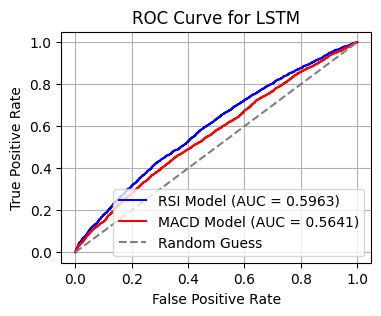

AUC for Model 1: 0.5963
AUC for Model 2: 0.5641


In [54]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Ensure that you are using the predicted probabilities instead of binary predictions
probabilities1 = model1.predict(X_train)  # Predicted probabilities for model 1
probabilities2 = model2.predict(X_train)  # Predicted probabilities for model 2

# Compute AUC for each model
auc1 = roc_auc_score(y_train, probabilities1)
auc2 = roc_auc_score(y_train, probabilities2)

# Get ROC curve data for plotting (False Positive Rate, True Positive Rate)
fpr1, tpr1, _ = roc_curve(y_train, probabilities1)
fpr2, tpr2, _ = roc_curve(y_train, probabilities2)

# Plot ROC curves
plt.figure(figsize=(4, 3))

# Plot Model 1 ROC curve
plt.plot(fpr1, tpr1, color='blue', label=f'RSI Model (AUC = {auc1:.4f})')

# Plot Model 2 ROC curve
plt.plot(fpr2, tpr2, color='red', label=f'MACD Model (AUC = {auc2:.4f})')

# Plot the random guess line (diagonal line)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')

# Adding labels and title
plt.title('ROC Curve for LSTM')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()

# Output the AUC values
print(f"AUC for Model 1: {auc1:.4f}")
print(f"AUC for Model 2: {auc2:.4f}")


285/285 [==============================] - 1s 3ms/step


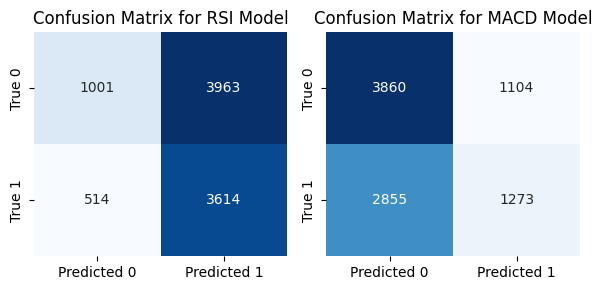

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Get predicted probabilities
probabilities1 = model1.predict(X_train)  # Probabilities for model 1
probabilities2 = model2.predict(X_train)  # Probabilities for model 2

# Convert probabilities to binary predictions using a threshold of 0.5
predictions1 = (probabilities1 >= 0.5).astype(int)  # Binary predictions for model 1
predictions2 = (probabilities2 >= 0.5).astype(int)  # Binary predictions for model 2

# Compute confusion matrices
cm1 = confusion_matrix(y_train, predictions1)
cm2 = confusion_matrix(y_train, predictions2)

# Plot confusion matrix for Model 1
plt.figure(figsize=(6, 3))

# Subplot for Model 1
plt.subplot(1, 2, 1)
sns.heatmap(cm1, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['True 0', 'True 1'])
plt.title(f'Confusion Matrix for RSI Model')

# Subplot for Model 2
plt.subplot(1, 2, 2)
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['True 0', 'True 1'])
plt.title(f'Confusion Matrix for MACD Model')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


285/285 [==============================] - 1s 3ms/step


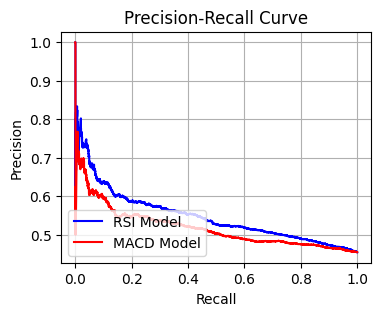

AUC for RSI Model: 0.5468
AUC for MACD Model: 0.5172


In [56]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get predicted probabilities
probabilities1 = model1.predict(X_train)  # Probabilities for model 1
probabilities2 = model2.predict(X_train)  # Probabilities for model 2

# Compute precision-recall curve for each model
precision1, recall1, _ = precision_recall_curve(y_train, probabilities1)
precision2, recall2, _ = precision_recall_curve(y_train, probabilities2)

# Compute AUC for the precision-recall curve
auc1 = auc(recall1, precision1)
auc2 = auc(recall2, precision2)

# Plot Precision-Recall curves
plt.figure(figsize=(4, 3))

# Plot Precision-Recall curve for Model 1
plt.plot(recall1, precision1, color='blue', label=f'RSI Model ')

# Plot Precision-Recall curve for Model 2
plt.plot(recall2, precision2, color='red', label=f'MACD Model')

# Adding labels and title
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='lower left')
plt.grid(True)

# Show the plot
plt.show()

# Output the AUC values
print(f"AUC for RSI Model: {auc1:.4f}")
print(f"AUC for MACD Model: {auc2:.4f}")
